# Predict access

Esse projeto visa prever o número de acessos do serviço de uma empresa fictícia.

O arquivo de histório de acessos está disponível em files/Historico_de_Acessos_2018_2019.csv e possui 3 colunas: Data, Hora e Acessos.

O arquivo de logs possui alguns registros de status do sistema e está disponível em files/Logs.csv. Ele possui 2 colunas: Data e Descrição.

# Entendendo os dados

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import IsolationForest
from sklearn.metrics import mean_absolute_error
from datetime import datetime
import numpy as np


history = pd.read_csv('./files/Historico_de_Acessos_2018_2019.csv', sep = ';')

print(history)

             Data   Hora    Acessos
0      01/01/2018  00:00  2859964.0
1      01/01/2018  01:00  2601217.0
2      01/01/2018  02:00  2454873.0
3      01/01/2018  03:00  2224689.0
4      01/01/2018  04:00  2285035.0
...           ...    ...        ...
13867  31/07/2019  19:00  3095856.0
13868  31/07/2019  20:00  3272262.0
13869  31/07/2019  21:00   330785.0
13870  31/07/2019  22:00  3242498.0
13871  31/07/2019  23:00   315667.0

[13872 rows x 3 columns]


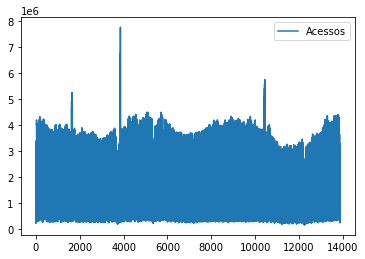

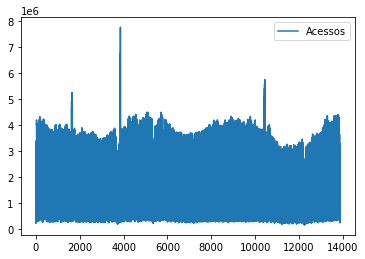

In [2]:
history.plot().get_figure()

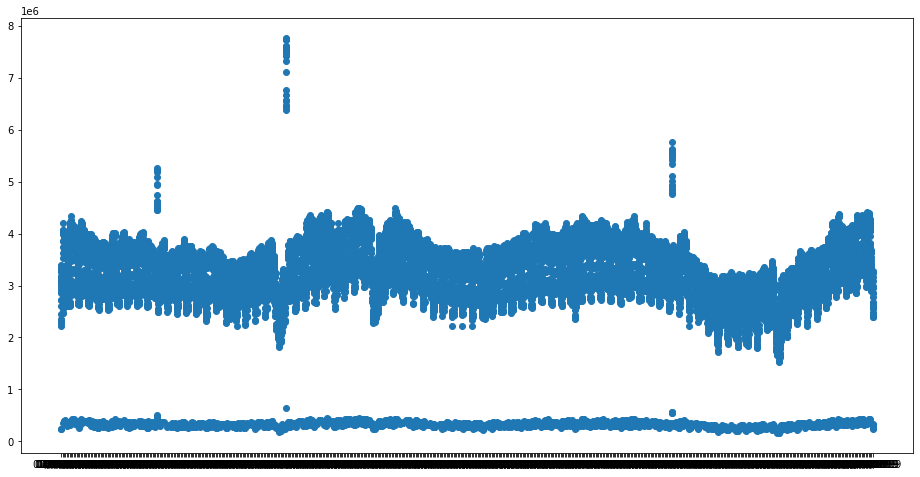

In [3]:
fig, ax = plt.subplots(figsize=(16,8))
ax.scatter(history['Data'],history['Acessos'])
plt.show()

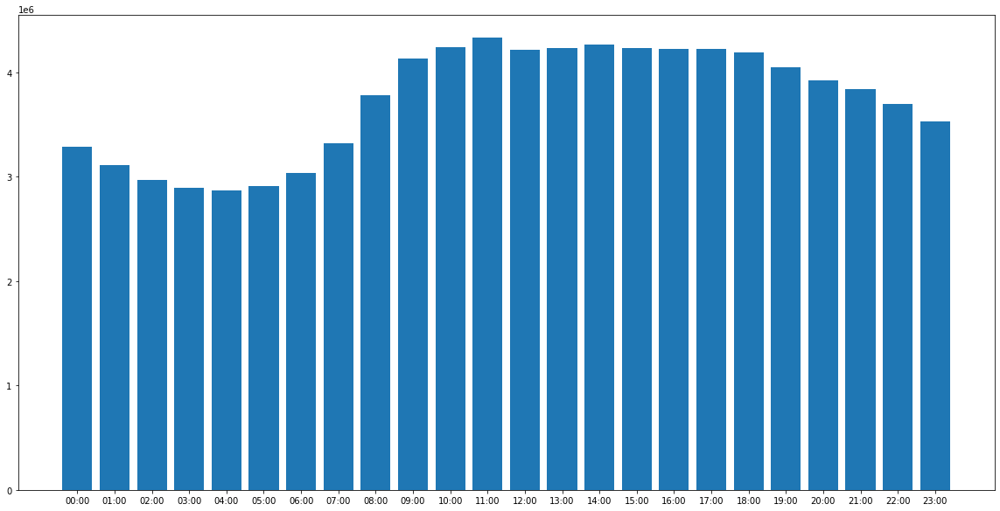

In [4]:
# Acessos por hora

plt.figure(figsize=(20,10))

plt.bar(history['Hora'].iloc[0:1000], history['Acessos'].iloc[0:1000])
plt.show()

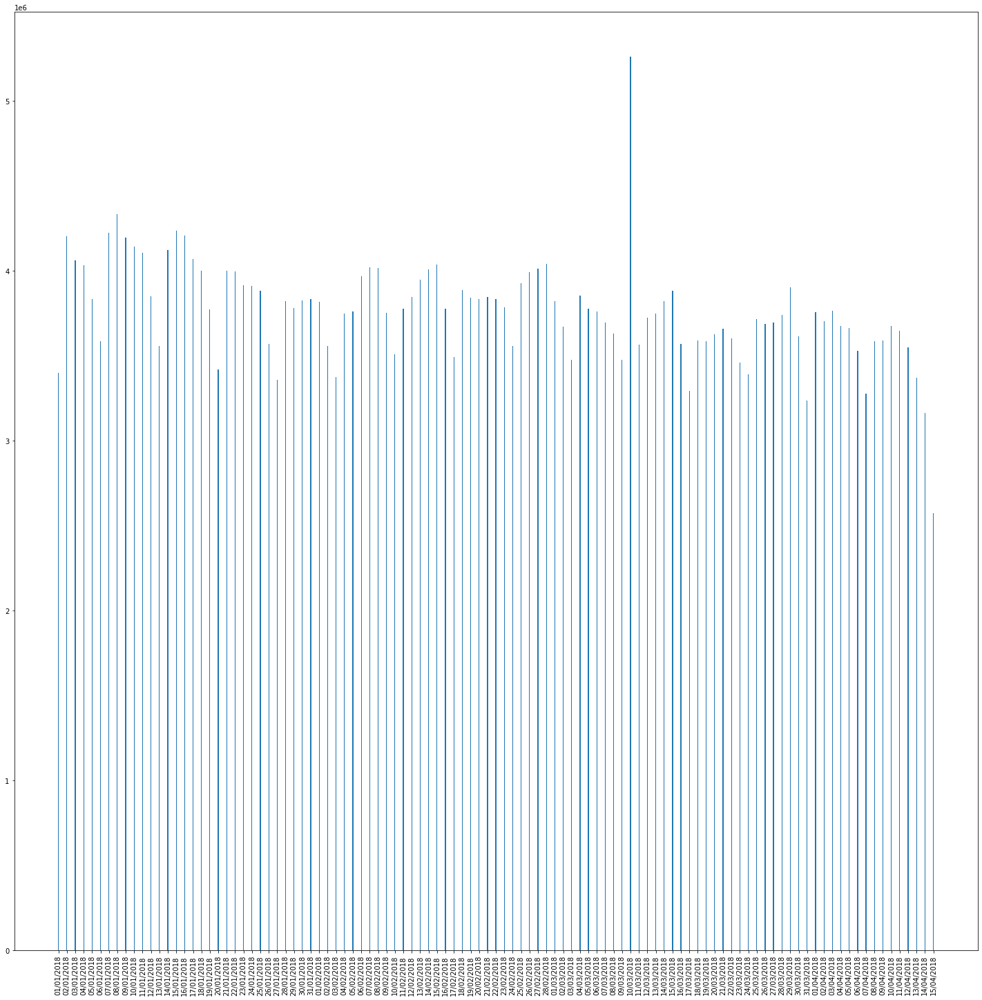

In [5]:
# Acessos por dia

plt.figure(figsize=(25,25))

plt.bar(history['Data'].iloc[0:2500], history['Acessos'].iloc[0:2500], width=0.1)
plt.xticks(rotation=90)
plt.show()

### Retirando outliers

#### Tratando os dados e retirando caracteres que podem atrapalhar como \n, /, etc.

In [6]:
history['Data'] = [date.rstrip('\n') for date in history['Data']]
history['Data'] = [date.replace('/','-') for date in history['Data']]
history['Hora'] = [time.rstrip('\n') for time in history['Hora']]

history.dropna(inplace=True)

print(history)

             Data   Hora    Acessos
0      01-01-2018  00:00  2859964.0
1      01-01-2018  01:00  2601217.0
2      01-01-2018  02:00  2454873.0
3      01-01-2018  03:00  2224689.0
4      01-01-2018  04:00  2285035.0
...           ...    ...        ...
13867  31-07-2019  19:00  3095856.0
13868  31-07-2019  20:00  3272262.0
13869  31-07-2019  21:00   330785.0
13870  31-07-2019  22:00  3242498.0
13871  31-07-2019  23:00   315667.0

[13796 rows x 3 columns]


#### Achando os outliers

<AxesSubplot:>

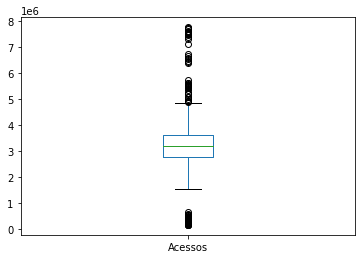

In [7]:
history.boxplot(column =['Acessos'], grid = False) 

#### Entendendo o log de acessos

In [8]:
logs = pd.read_csv('./files/Logs.csv', sep = ';')

print(logs)

logs['Data'] = [date.rstrip('\n') for date in logs['Data']]
logs['Data'] = [date.replace('/','-') for date in logs['Data']]

print(logs)

         Data              Descricao
0  10/03/2018      New feature added
1  01/05/2018            System down
2  10/06/2018      New feature added
3  10/03/2019  New version published
4  05/05/2019            System down
         Data              Descricao
0  10-03-2018      New feature added
1  01-05-2018            System down
2  10-06-2018      New feature added
3  10-03-2019  New version published
4  05-05-2019            System down


             Data   Hora    Acessos
1632   10-03-2018  00:00  4934041.0
1633   10-03-2018  01:00   475427.0
1634   10-03-2018  02:00  4625896.0
1635   10-03-2018  03:00  4556317.0
1636   10-03-2018  04:00  4529397.0
...           ...    ...        ...
10438  10-03-2019  22:00  5482769.0
10439  10-03-2019  23:00  5340923.0
11781  05-05-2019  21:00  3157590.0
11782  05-05-2019  22:00  3056357.0
11783  05-05-2019  23:00  2962613.0

[92 rows x 3 columns]
0    10-03-2018
1    01-05-2018
2    10-06-2018
3    10-03-2019
4    05-05-2019
Name: Data, dtype: object


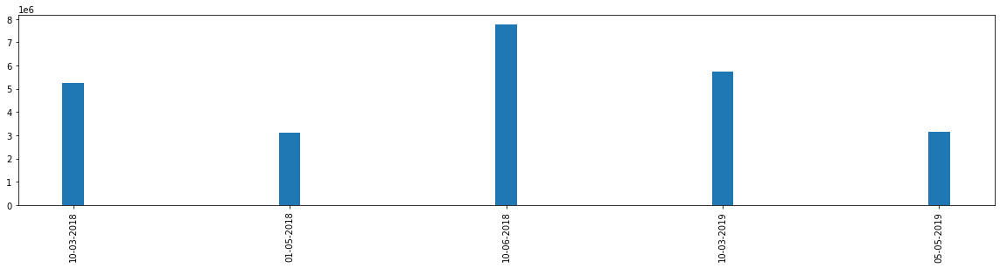

In [9]:
historyData = history[history['Data'].isin(logs['Data'])]

print(historyData)

historyData = historyData.sort_index().sort_index(axis=0)
logsData = logs['Data']

logsData = logsData.sort_index().sort_index(axis=0)

print(logsData)

plt.figure(figsize=(20,4))

plt.bar(historyData['Data'].iloc[0:2500], historyData['Acessos'].iloc[0:2500], width=0.1)
plt.xticks(rotation=90)
plt.show()

#### Usando z-score para reduzir os outliers

In [10]:
from scipy import stats

z=np.abs(stats.zscore(history.Acessos))

print(z)

print(np.where(z > 3))

historyFilteredZ = history[z<3]

print(historyFilteredZ)

print(history.shape)
print(historyFilteredZ.shape)

[0.12541592 0.37780937 0.52055989 ... 2.59249079 0.24772494 2.60723756]
(array([3812, 3813, 3814, 3815, 3816, 3817, 3819, 3820, 3821, 3822, 3823,
       3824, 3825, 3826, 3827, 3828, 3829, 3830, 3831, 3832, 3833, 3834,
       3835]),)
             Data   Hora    Acessos
0      01-01-2018  00:00  2859964.0
1      01-01-2018  01:00  2601217.0
2      01-01-2018  02:00  2454873.0
3      01-01-2018  03:00  2224689.0
4      01-01-2018  04:00  2285035.0
...           ...    ...        ...
13867  31-07-2019  19:00  3095856.0
13868  31-07-2019  20:00  3272262.0
13869  31-07-2019  21:00   330785.0
13870  31-07-2019  22:00  3242498.0
13871  31-07-2019  23:00   315667.0

[13773 rows x 3 columns]
(13796, 3)
(13773, 3)


<AxesSubplot:>

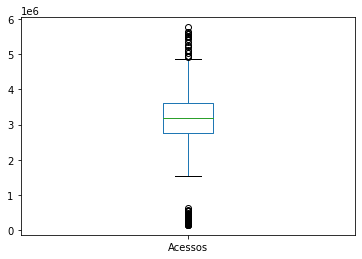

In [11]:
# Analisando o resultado

historyFilteredZ.boxplot(column =['Acessos'], grid = False) 

#### Utilizando quantil para reduzir outliers

In [12]:
Q1=historyFilteredZ['Acessos'].quantile(0.25)

Q3=historyFilteredZ['Acessos'].quantile(0.75)

IQR=Q3-Q1

print(Q1)
print(Q3)
print(IQR)

lower = Q1 - 1.5*IQR
upper = Q3 + 1.5*IQR

print(lower, upper)


2767473.0
3616756.0
849283.0
1493548.5 4890680.5


In [13]:
historyFilteredQ = historyFilteredZ[(historyFilteredZ['Acessos']> lower) & (historyFilteredZ['Acessos']< upper)]

print(historyFilteredQ)

print(history.shape)
print(historyFilteredQ.shape)

             Data   Hora    Acessos
0      01-01-2018  00:00  2859964.0
1      01-01-2018  01:00  2601217.0
2      01-01-2018  02:00  2454873.0
3      01-01-2018  03:00  2224689.0
4      01-01-2018  04:00  2285035.0
...           ...    ...        ...
13865  31-07-2019  17:00  2862666.0
13866  31-07-2019  18:00  2984558.0
13867  31-07-2019  19:00  3095856.0
13868  31-07-2019  20:00  3272262.0
13870  31-07-2019  22:00  3242498.0

[12381 rows x 3 columns]
(13796, 3)
(12381, 3)


### Analisando os dados filtrados

<AxesSubplot:>

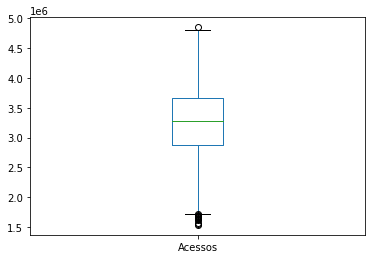

In [14]:
historyFilteredQ.boxplot(column =['Acessos'], grid = False) 

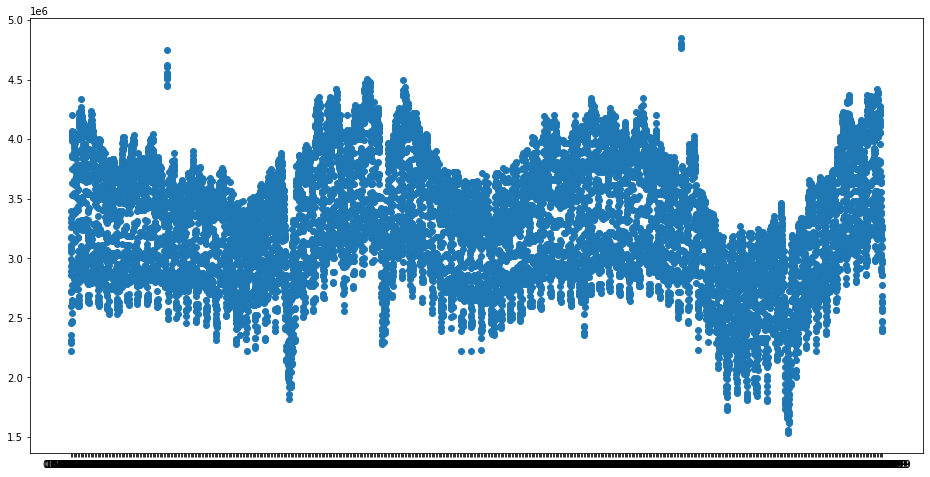

In [15]:
fig, ax = plt.subplots(figsize=(16,8))
ax.scatter(historyFilteredQ['Data'],historyFilteredQ['Acessos'])
plt.show()

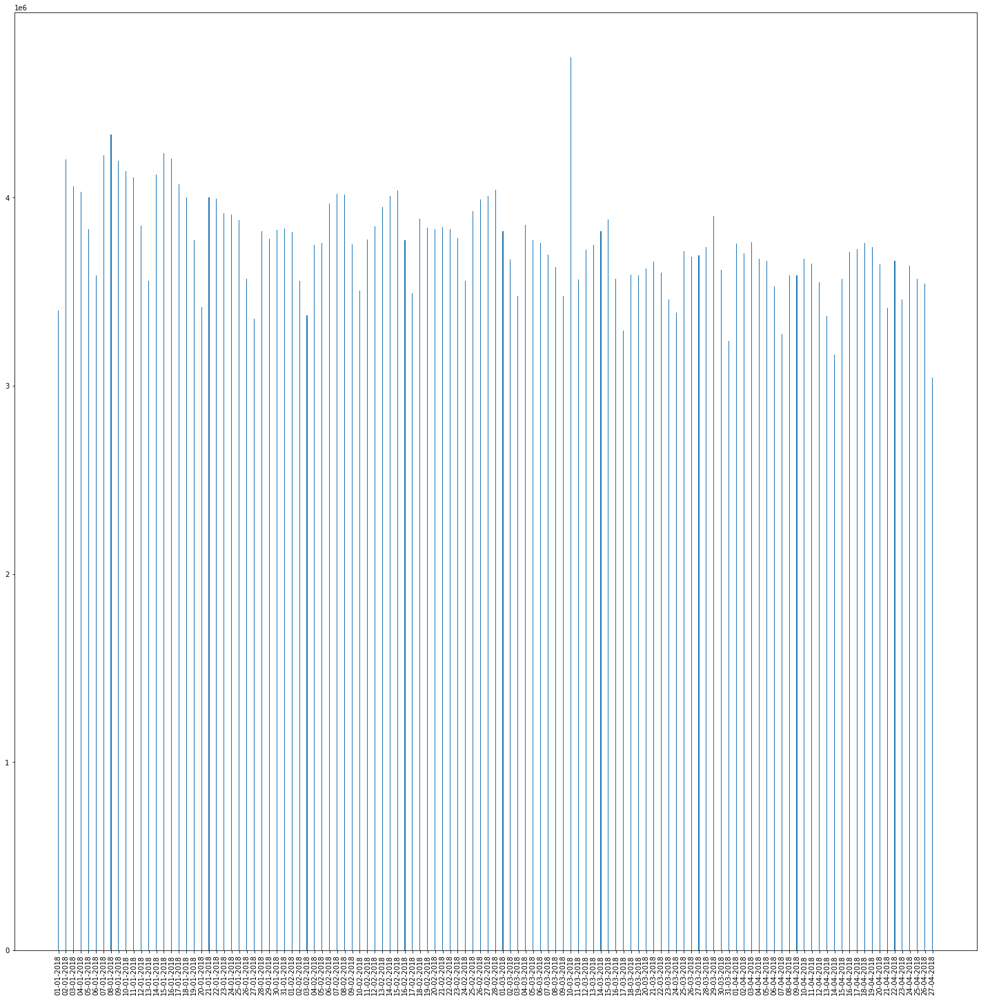

In [16]:
plt.figure(figsize=(25,25))

plt.bar(historyFilteredQ['Data'].iloc[0:2500], historyFilteredQ['Acessos'].iloc[0:2500], width=0.1)
plt.xticks(rotation=90)
plt.show()

### Encontrando dados inválidos

In [17]:
historyDatetime = []
historyDroped = []

for data in historyFilteredQ.iterrows():
    d = data[1]['Data']
    t = data[1]['Hora']
    a = data[1]['Acessos']
    try:
        dt = pd.to_datetime("{} {}".format(d, t), format='%d-%m-%Y %H:%M', errors='raise')
        dtf = pd.to_numeric(dt.timestamp(), downcast='float', errors='raise')
        historyDatetime.append([dtf, a])    
    except:
        historyDroped.append([d, t, a])
        continue        

        
print(historyDroped) # Foi encontrada a data 29/02 que não existe

[['29-02-2019', '00:00', 3213323.0], ['29-02-2019', '02:00', 2898958.0], ['29-02-2019', '03:00', 2827419.0], ['29-02-2019', '04:00', 2794957.0], ['29-02-2019', '05:00', 2835036.0], ['29-02-2019', '06:00', 2896923.0], ['29-02-2019', '08:00', 3298323.0], ['29-02-2019', '09:00', 3569728.0], ['29-02-2019', '10:00', 3712965.0], ['29-02-2019', '11:00', 3790083.0], ['29-02-2019', '12:00', 3722991.0], ['29-02-2019', '13:00', 3704948.0], ['29-02-2019', '15:00', 3566619.0], ['29-02-2019', '17:00', 3605244.0], ['29-02-2019', '18:00', 3686392.0], ['29-02-2019', '19:00', 3767362.0], ['29-02-2019', '20:00', 3670112.0], ['29-02-2019', '22:00', 3461446.0], ['29-02-2019', '23:00', 3328772.0]]


In [18]:
historyFiltered = pd.DataFrame(historyFilteredQ[historyFilteredQ.Data != historyDroped[0][0]])

In [19]:
print(historyFiltered)

             Data   Hora    Acessos
0      01-01-2018  00:00  2859964.0
1      01-01-2018  01:00  2601217.0
2      01-01-2018  02:00  2454873.0
3      01-01-2018  03:00  2224689.0
4      01-01-2018  04:00  2285035.0
...           ...    ...        ...
13865  31-07-2019  17:00  2862666.0
13866  31-07-2019  18:00  2984558.0
13867  31-07-2019  19:00  3095856.0
13868  31-07-2019  20:00  3272262.0
13870  31-07-2019  22:00  3242498.0

[12362 rows x 3 columns]


In [20]:
# Verificando se ainda existe a data excluída

print(historyFiltered[historyFiltered['Data']=='29-02-2019'])

Empty DataFrame
Columns: [Data, Hora, Acessos]
Index: []


<AxesSubplot:>

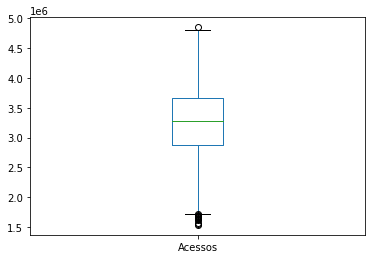

In [21]:
# Resultado do filtro

historyFiltered.boxplot(column =['Acessos'], grid = False) 

In [22]:
historyFiltered.head()

,Data,Hora,Acessos
0,01-01-2018,00:00,2859964.0
1,01-01-2018,01:00,2601217.0
2,01-01-2018,02:00,2454873.0
3,01-01-2018,03:00,2224689.0
4,01-01-2018,04:00,2285035.0


#### Traçando médias móveis de 1 dias e 1 mês

In [23]:
historyFiltered['MA24'] = historyFiltered['Acessos'].rolling(24).mean()
historyFiltered['MA720'] = historyFiltered['Acessos'].rolling(720).mean()

In [24]:
import plotly.express as px

fig = px.line(historyFiltered, x="Data", y=['Acessos', 'MA24', 'MA720'], title='Média móvel de acessos em 24 horas e 30 dias', template = 'plotly_dark')
fig.show()

In [25]:
accessData = pd.concat([pd.DataFrame(historyFiltered['Data']), 
                       pd.DataFrame(historyFiltered['Hora']), 
                       pd.DataFrame(historyFiltered['Acessos']) 
                       ], axis=1 )
accessData.head()

,Data,Hora,Acessos
0,01-01-2018,00:00,2859964.0
1,01-01-2018,01:00,2601217.0
2,01-01-2018,02:00,2454873.0
3,01-01-2018,03:00,2224689.0
4,01-01-2018,04:00,2285035.0


In [26]:
accessData.set_index(['Data', 'Hora'], drop=True, inplace=True)
accessData.head(48)

Acessos
Data       Hora            
01-01-2018 00:00  2859964.0
           01:00  2601217.0
           02:00  2454873.0
           03:00  2224689.0
           04:00  2285035.0
           06:00  2310673.0
           07:00  2357576.0
           09:00  2728570.0
           10:00  2719425.0
           11:00  2895857.0
           12:00  2994832.0
           13:00  3056054.0
           14:00  3079472.0
           15:00  3112337.0
           16:00  3168329.0
           17:00  3306835.0
           18:00  3398784.0
           19:00  3334278.0
           20:00  3265380.0
           21:00  3182999.0
           22:00  3106050.0
           23:00  2937157.0
02-01-2018 00:00  2779614.0
           01:00  2633773.0
           02:00  2538825.0
           03:00  2473151.0
           04:00  2462698.0
           06:00  2651930.0
           07:00  2969431.0
           09:00  3865878.0
           10:00  4017658.0
           11:00  4201776.0
           12:00  3987110.0
           13:00  4051054.0
           14:00  4068820.0
           15:00  4050262.0
           16:00  4062756.0
           17:00  4034462.0
           18:00  3997997.0
           19:00  3851533.0
           20:00  3748224.0
           21:00  3631367.0
           22:00  3532921.0
           23:00  3356228.0
03-01-2018 00:00  3134138.0
           01:00  2951817.0
           02:00  2822173.0
           03:00  2756269.0

In [27]:
# Criando variáveis para uso no algoritmo de treinamento

accessData['day'] = [i[0] for i in accessData.index]
accessData['day_name'] = [pd.to_datetime(i[0]).day_name() for i in accessData.index]
accessData['day_of_year'] = [pd.to_datetime(i[0]).dayofyear for i in accessData.index]
accessData['week_of_year'] = [pd.to_datetime(i[0]).weekofyear for i in accessData.index]
accessData['hour'] = [pd.to_datetime(i[1]).hour for i in accessData.index]
accessData['is_weekday'] = [pd.to_datetime(i[0]).isoweekday() for i in accessData.index]
accessData.head()

Acessos         day day_name  day_of_year  week_of_year  \
Data       Hora                                                               
01-01-2018 00:00  2859964.0  01-01-2018   Monday            1             1   
           01:00  2601217.0  01-01-2018   Monday            1             1   
           02:00  2454873.0  01-01-2018   Monday            1             1   
           03:00  2224689.0  01-01-2018   Monday            1             1   
           04:00  2285035.0  01-01-2018   Monday            1             1   

                  hour  is_weekday  
Data       Hora                     
01-01-2018 00:00     0           1  
           01:00     1           1  
           02:00     2           1  
           03:00     3           1  
           04:00     4           1

In [28]:
import pycaret
from pycaret.regression import *                     
             

classe = setup(data = accessData,           
              target = 'Acessos', transform_target = True, session_id = 123)

best = compare_models() # Procurando o melhor modelo

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
0,Extreme Gradient Boosting,103153.0224,19442943936.4176,139267.8087,0.9270,0.0463,0.0331,0.8762
1,Random Forest,118912.6760,31626876604.9321,177602.3919,0.8812,0.0613,0.0393,0.4974
2,CatBoost Regressor,144604.8814,38675327900.7250,196525.9558,0.8547,0.0649,0.0467,1.7014
3,Decision Tree,137322.3368,52404597632.3821,228545.6756,0.8032,0.0780,0.0447,0.0345
4,Light Gradient Boosting Machine,169103.2113,53430726740.6951,230941.6599,0.7993,0.0768,0.0549,0.0819
5,Extra Trees Regressor,156852.7720,54207352685.8914,232739.3335,0.7962,0.0787,0.0517,0.4761
6,K Neighbors Regressor,197762.7229,73758520876.8412,271451.2041,0.7225,0.0892,0.0637,0.0264
7,Gradient Boosting Regressor,228607.6688,96825678717.8331,310888.1324,0.6366,0.1020,0.0743,0.5879
8,AdaBoost Regressor,313055.4704,158871914132.4671,398417.0604,0.4032,0.1268,0.0992,0.2644
9,Linear Regression,324659.4143,169244370769.1612,411208.8423,0.3642,0.1322,0.1044,0.0215


In [29]:
accessData.reset_index(drop=True, inplace=True)
accessData.head()

,Acessos,day,day_name,day_of_year,week_of_year,hour,is_weekday
0,2859964.0,01-01-2018,Monday,1,1,0,1
1,2601217.0,01-01-2018,Monday,1,1,1,1
2,2454873.0,01-01-2018,Monday,1,1,2,1
3,2224689.0,01-01-2018,Monday,1,1,3,1
4,2285035.0,01-01-2018,Monday,1,1,4,1


In [30]:
predictions = predict_model(best, data=accessData)

#### Criando datas futuras para testar a previsão do modelo

In [31]:
import datetime

finalDate = pd.to_datetime(historyFiltered['Data'].iloc[-1]) + datetime.timedelta(days=1)

finalDate = finalDate.strftime('%Y-%m-%d')

dateRange = pd.date_range(start=finalDate, end = pd.to_datetime(finalDate) + datetime.timedelta(days=365), freq = '60min')
    

In [32]:
# Comparando os acessos com o que foi treinado

fig = px.line(predictions, x='day', y=["Acessos", "Label"], template = 'plotly_dark')

fig.show()

In [33]:
finalBest = finalize_model(best)

In [34]:
# Gerando variáveis para utilizar na previsão

futureDf = pd.DataFrame()

futureDf['day'] = [i.date() for i in dateRange]
futureDf['day_name'] = [i.day_name() for i in dateRange]
futureDf['day_of_year'] = [i.dayofyear for i in dateRange]
futureDf['week_of_year'] = [i.weekofyear for i in dateRange]
futureDf['hour'] = [i.hour for i in dateRange]
futureDf['is_weekday'] = [i.isoweekday() for i in dateRange]
futureDf.head()


,day,day_name,day_of_year,week_of_year,hour,is_weekday
0,2019-08-01,Thursday,213,31,0,4
1,2019-08-01,Thursday,213,31,1,4
2,2019-08-01,Thursday,213,31,2,4
3,2019-08-01,Thursday,213,31,3,4
4,2019-08-01,Thursday,213,31,4,4


In [35]:
predictionsFuture = predict_model(finalBest, data=futureDf)
predictionsFuture.head()

,day,day_name,day_of_year,week_of_year,hour,is_weekday,Label
index,,,,,,,
0,2019-08-01,Thursday,213,31,0,4,3305969.75
1,2019-08-01,Thursday,213,31,1,4,3131012.25
2,2019-08-01,Thursday,213,31,2,4,3021703.75
3,2019-08-01,Thursday,213,31,3,4,2959480.00
4,2019-08-01,Thursday,213,31,4,4,2933027.25


In [36]:
print(predictionsFuture)

              day  day_name  day_of_year  week_of_year  hour  is_weekday  \
index                                                                      
0      2019-08-01  Thursday          213            31     0           4   
1      2019-08-01  Thursday          213            31     1           4   
2      2019-08-01  Thursday          213            31     2           4   
3      2019-08-01  Thursday          213            31     3           4   
4      2019-08-01  Thursday          213            31     4           4   
...           ...       ...          ...           ...   ...         ...   
8756   2020-07-30  Thursday          212            31    20           4   
8757   2020-07-30  Thursday          212            31    21           4   
8758   2020-07-30  Thursday          212            31    22           4   
8759   2020-07-30  Thursday          212            31    23           4   
8760   2020-07-31    Friday          213            31     0           5   

           

# Concatenando os dados treinados com o previsto e apresentando o resultado

In [37]:
concatDf = pd.concat([historyFiltered['Data'], historyFiltered['Acessos']], axis=1)
concatDf2 = pd.concat([predictionsFuture['day'],predictionsFuture['Label']], axis=1)
concatDf2 = concatDf2.rename(columns={'day':'Data'})
concatDf2['Data'] = [i.strftime('%d-%m-%Y') for i in concatDf2['Data']]
concatDf2.reset_index(drop=True, inplace=True)
concat = pd.concat([concatDf, concatDf2], axis=0)
concat.reset_index(drop=True, inplace=True)

fig = px.line(concat, x="Data", y=["Acessos", "Label"], template = 'plotly_dark')
fig.show()